In [75]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2

In [29]:
pd.set_option("display.max_rows", 800)

In [30]:
df = pd.read_csv('../results/brisque_scores.csv')
df

,algorithm,original_filename,score
0,bbhe,MuzYhuKsV6.png,6.516089
1,bbhe,7OKvzizH.png,0.000000
2,bbhe,eD80tfb0.png,24.037924
3,bbhe,1UXZfhm4.png,4.364923
4,bbhe,VaD7nRZa.png,23.151558
5,bbhe,Cc00ToIMR8.png,17.171806
6,bbhe,5RvkxlEn.png,17.742365
7,bbhe,2462.png,0.000000
8,bbhe,iB4bryDl.png,0.571062
9,bbhe,cWgtknxT.png,6.554867


## High/Low Scores

In [39]:
df.sort_values(["score", "original_filename"]).head(50)

,algorithm,original_filename,score
34,bbhe,0PYwg4mI.png,0.0
256,splinet,0PYwg4mI.png,0.0
599,clahe,0PYwg4mI.png,0.0
205,splinet,1122.png,0.0
195,bbhe,1432.png,0.0
487,no_processing,1432.png,0.0
74,bbhe,1952.png,0.0
395,splinet,1952.png,0.0
430,no_processing,1952.png,0.0
694,clahe,1952.png,0.0


In [40]:
low_scores = ["1952.png", "2372.png", "InXetlKB.png", "LsKt0JiE.png", "WCDgx0hR.png"]

In [42]:
df.sort_values("score").tail(15)

,algorithm,original_filename,score
353,splinet,png94Aoo.png,50.318863
716,clahe,HRIDu722.png,50.336044
670,clahe,KqXeI8YB.png,50.496063
182,bbhe,5022.png,51.361668
297,splinet,cSCqquLSO7.png,51.996956
278,splinet,3342.png,52.265312
615,clahe,gx8Ivlr7.png,52.508354
676,clahe,png94Aoo.png,53.063175
52,bbhe,4342.png,53.851948
332,splinet,KqXeI8YB.png,55.560432


In [43]:
high_scores = ["4342.png", "KqXeI8YB.png"]

## Very Positive/Very Negative Differentials

In [44]:
# unique original filenames
fns = pd.unique(df.original_filename)
fns.size

199

In [45]:
diff = pd.DataFrame(columns=["original_filename", "bbhe", "clahe", "splinet", "no_processing"])
# the algorithm columns are deltas compared to no_processing
for i, fn in enumerate(fns):
    rows = df.query('original_filename==@fn')
    np_score = rows[rows.algorithm == "no_processing"].score.iloc[0]
    result = {
        "original_filename": fn,
        "bbhe": rows.query('algorithm=="bbhe"').score.iloc[0] - np_score,
        "clahe": rows.query('algorithm=="clahe"').score.iloc[0] - np_score,
        "splinet": rows.query('algorithm=="splinet"').score.iloc[0] - np_score,
         "no_processing": np_score,
    }
    diff = diff.append(result, ignore_index=True)
diff

,original_filename,bbhe,clahe,splinet,no_processing
0,MuzYhuKsV6.png,0.983030,10.260070,-4.642611,5.533060
1,7OKvzizH.png,-8.826059,-6.290877,-8.826059,8.826059
2,eD80tfb0.png,6.734516,15.969915,1.853905,17.303408
3,1UXZfhm4.png,-18.782008,-23.146931,-13.262877,23.146931
4,VaD7nRZa.png,8.863526,13.351562,6.731551,14.288032
5,Cc00ToIMR8.png,8.392522,15.599711,2.785000,8.779284
6,5RvkxlEn.png,0.881620,9.327162,-11.161663,16.860744
7,2462.png,-5.241028,-3.972786,-5.241028,5.241028
8,iB4bryDl.png,-7.925454,-8.496515,4.914536,8.496515
9,cWgtknxT.png,-6.357327,-4.231492,-7.235535,12.912194


In [49]:
diff.sort_values("bbhe").head(5)

,original_filename,bbhe,clahe,splinet,no_processing
99,trqsuJYz.png,-35.169296,-18.418556,-26.524469,55.589737
126,YXlYNduz.png,-22.871082,-30.724655,-3.277824,41.299690
77,jhoN0GAh.png,-21.738848,-16.068489,-6.687517,36.600727
42,P7DvpTbO.png,-20.949737,-15.961741,-13.863756,26.647484
94,aI3134Gxqs.png,-20.421577,-2.983494,-6.974277,20.550724


In [51]:
diff.sort_values("clahe").head(5)

,original_filename,bbhe,clahe,splinet,no_processing
88,RTteaWRH.png,-16.563856,-37.434790,-3.371189,41.462677
126,YXlYNduz.png,-22.871082,-30.724655,-3.277824,41.299690
160,K6Zzjawc.png,-8.029051,-27.709320,-4.955784,27.709320
52,4342.png,-11.491154,-26.492317,4.271523,65.343102
70,2572.png,-5.387074,-24.168814,-8.985559,24.168814


In [53]:
diff.sort_values("splinet").head(5)

,original_filename,bbhe,clahe,splinet,no_processing
99,trqsuJYz.png,-35.169296,-18.418556,-26.524469,55.589737
67,ZYf6pW74.png,-9.356476,-4.017691,-24.003525,32.900059
192,0AKZCRZA.png,-16.324707,-5.770317,-18.979201,25.002766
60,UrQOC1ml.png,-13.707618,-18.654144,-18.654144,18.654144
82,NCieZQsu.png,-12.306543,-2.767531,-17.911514,17.911514


In [55]:
large_improvement = ["trqsuJYz.png", "YXlYNduz.png", "RTteaWRH.png"]

In [50]:
diff.sort_values("bbhe").tail(5)

,original_filename,bbhe,clahe,splinet,no_processing
106,S8ISSF7y.png,16.038504,13.168861,11.784101,16.359728
182,5022.png,17.172523,-2.265835,1.955257,34.189144
80,oMvb4N1U.png,18.552887,20.053764,15.950817,27.232418
92,7hELOk55.png,23.522089,11.433357,3.649428,2.661157
133,1GjI0YIS.png,27.457762,19.488596,8.525528,2.967344


In [52]:
diff.sort_values("clahe").tail(5)

,original_filename,bbhe,clahe,splinet,no_processing
80,oMvb4N1U.png,18.552887,20.053764,15.950817,27.232418
100,cSCqquLSO7.png,9.728012,20.186371,12.747658,39.249298
98,jb2OPpkq.png,7.067432,25.534211,12.117140,4.954917
165,YSv3ZMAB.png,10.488166,25.552482,15.313516,1.192950
72,KqXeI8YB.png,13.112473,39.447382,44.511751,11.048681


In [54]:
diff.sort_values("splinet").tail(5)

,original_filename,bbhe,clahe,splinet,no_processing
144,2492.png,9.748603,14.989797,13.407800,14.326749
164,jWmtaMHD.png,-17.608974,-12.622211,13.817942,21.900145
165,YSv3ZMAB.png,10.488166,25.552482,15.313516,1.192950
80,oMvb4N1U.png,18.552887,20.053764,15.950817,27.232418
72,KqXeI8YB.png,13.112473,39.447382,44.511751,11.048681


In [56]:
large_deterioration = ["KqXeI8YB.png", "1GjI0YIS.png", "YSv3ZMAB.png", "oMvb4N1U.png"]

## Human-understandable interesting images

- "Normal case"
- "Bad case"

-> hard to tell manually, ignore.

- Underexposed images
- overexposed images
- images with dark background
- images with bright background

-> choose one or two for each case by looking through the images

In [139]:
interesting_visually = ["9OjeQH6M.png", # bright background
               "3892.png", # overexposed
               "SysAwAyC.png", # underexposed
               "rsfnjiLK.png", # dark background
               "ujrogeR3.png", # just super normal and great looking already
              ]

## Plot the interesting ones

In [140]:
interesting = []
interesting.extend(low_scores)
interesting.extend(high_scores)
interesting.extend(large_improvement)
interesting.extend(large_deterioration)
interesting.extend(interesting_visually)
print(len(interesting))
interesting

19


['1952.png',
 '2372.png',
 'InXetlKB.png',
 'LsKt0JiE.png',
 'WCDgx0hR.png',
 '4342.png',
 'KqXeI8YB.png',
 'trqsuJYz.png',
 'YXlYNduz.png',
 'RTteaWRH.png',
 'KqXeI8YB.png',
 '1GjI0YIS.png',
 'YSv3ZMAB.png',
 'oMvb4N1U.png',
 '9OjeQH6M.png',
 '3892.png',
 'SysAwAyC.png',
 'rsfnjiLK.png',
 'ujrogeR3.png']

KqXeI8YB is double in large deterioration and high score. 

In [141]:
# de-duplicate
interesting = list(dict.fromkeys(interesting))
print(len(interesting))
interesting

18


['1952.png',
 '2372.png',
 'InXetlKB.png',
 'LsKt0JiE.png',
 'WCDgx0hR.png',
 '4342.png',
 'KqXeI8YB.png',
 'trqsuJYz.png',
 'YXlYNduz.png',
 'RTteaWRH.png',
 '1GjI0YIS.png',
 'YSv3ZMAB.png',
 'oMvb4N1U.png',
 '9OjeQH6M.png',
 '3892.png',
 'SysAwAyC.png',
 'rsfnjiLK.png',
 'ujrogeR3.png']

In [142]:
# read in images
algos = ["no_processing", "bbhe", "clahe", "splinet"]
imgs = []
for original_filename in interesting:
    file_imgs = []
    for algo in algos:
        filename = original_filename.removesuffix(".png") + f"_{algo}.png"
        path = f"../processed/{algo}/{filename}"
        img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
        file_imgs.append(img)
    imgs.append(file_imgs)

In [100]:
df

,algorithm,original_filename,score
0,bbhe,MuzYhuKsV6.png,6.516089
1,bbhe,7OKvzizH.png,0.000000
2,bbhe,eD80tfb0.png,24.037924
3,bbhe,1UXZfhm4.png,4.364923
4,bbhe,VaD7nRZa.png,23.151558
5,bbhe,Cc00ToIMR8.png,17.171806
6,bbhe,5RvkxlEn.png,17.742365
7,bbhe,2462.png,0.000000
8,bbhe,iB4bryDl.png,0.571062
9,bbhe,cWgtknxT.png,6.554867


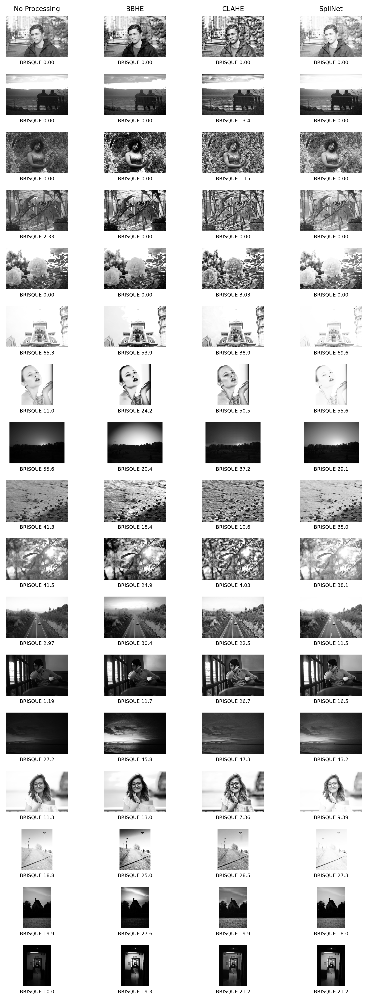

In [128]:
rows = len(interesting)
cols = 4
fig, axs = plt.subplots(rows, cols, figsize = (7, 1*rows), dpi=300)
for i in range(rows):
    for j in range(cols):
        ax = axs[i,j]
        ax.imshow(imgs[i][j], cmap="gray")
        
        # hide border and ticks
        #ax.axis("off")
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['bottom'].set_visible(False)
        ax.spines['left'].set_visible(False)
        ax.get_xaxis().set_ticks([])
        ax.get_yaxis().set_ticks([])
        
        algo = algos[j]
        original_filename = interesting[i]
        score = df.query("algorithm==@algo and original_filename==@original_filename").iloc[0].score
        ax.set_xlabel("BRISQUE {:#.3g}".format(score), fontsize=6)
        
        
col_names = ["No Processing", "BBHE", "CLAHE", "SpliNet"]
for j in range(cols):
    axs[0,j].set_title(col_names[j], fontsize=8)
    
fig.tight_layout()
fig.savefig("interesting_overview.png", bbox_inches=0)

## Subset

In [149]:
subset_inds = [17, 2, 6, 7, 11] # interesting for how representative they are

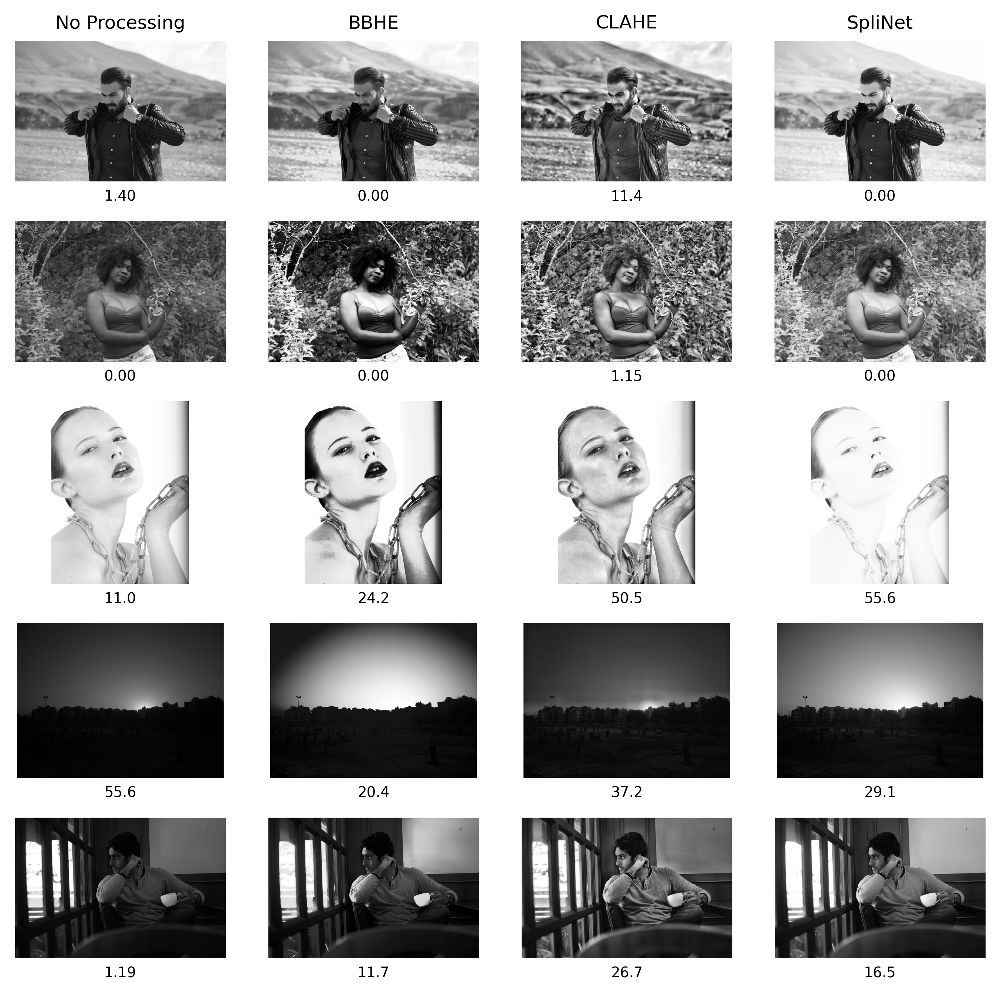

In [151]:
rows = len(subset_inds)
cols = 4
fig, axs = plt.subplots(rows, cols, figsize = (7, 1.35*rows), dpi=400, gridspec_kw={"height_ratios": [1, 1, 1.3, 1.1, 1]})
plt.subplots_adjust(left=0, top=1, right=1, bottom=0, wspace=0, hspace=0)

for i, i_img in enumerate(subset_inds):
    for j in range(cols):
        ax = axs[i,j]
        ax.imshow(imgs[i_img][j], cmap="gray")
        
        # hide border and ticks
        #ax.axis("off")
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['bottom'].set_visible(False)
        ax.spines['left'].set_visible(False)
        ax.get_xaxis().set_ticks([])
        ax.get_yaxis().set_ticks([])
        
        algo = algos[j]
        original_filename = interesting[i_img]
        score = df.query("algorithm==@algo and original_filename==@original_filename").iloc[0].score
        ax.set_xlabel("{:#.3g}".format(score), fontsize=7)
        
        
col_names = ["No Processing", "BBHE", "CLAHE", "SpliNet"]
for j in range(cols):
    axs[0,j].set_title(col_names[j], fontsize=9)

fig.tight_layout()
fig.savefig("image_comparison.png", bbox_inches="tight")